In [16]:
cd((@__DIR__) * raw"\..")
include("../table_reader.jl")
include("../utils/Missing_values.jl")

ImputeMissingValues!

In [17]:
series=extract_series("TX_STAID000031.txt",plot=false)
series=truncate_MV(series,"TX")
years=unique(Dates.year.(series.DATE))

include("../utils/Simulation.jl")
Days_list=GatherYearScenario(series[!,2],series.DATE)
avg_day=mean.(Days_list)
max_day=maximum.(Days_list)
df_month = @chain series begin
    @transform(:TEMP = series[!,2]) #Give a common name for TX, TN, etc...
    @transform(:MONTH = month.(:DATE)) #add month column
    @by(:MONTH, :MONTHLY_MEAN = mean(:TEMP), :MONTHLY_STD = std(:TEMP), :MONTHLY_MAX = maximum(:TEMP)) # grouby MONTH + takes the mean/std in each category 
end

#Imputing missing values
# include("utils/Missing_values.jl")
# ImputeMissingValues!(series[!,2],series.DATE)
# N=length(series[!,2])

Row,MONTH,MONTHLY_MEAN,MONTHLY_STD,MONTHLY_MAX
,Int64,Float64,Float64,Float64
1,1,11.7685,3.32309,21.2
2,2,12.8727,3.31852,22.7
3,3,15.4382,3.11683,26.1
4,4,17.9017,3.03244,26.2
5,5,21.9996,3.25811,31.9
6,6,25.4889,3.09155,36.0
7,7,28.5561,3.00014,40.6
8,8,28.0813,2.78482,36.4
9,9,24.7622,2.80431,33.0


## I. Series filtered by removing a trigonometric periodicity

In [20]:
include("../utils/periodicity.jl")
trigo_function=fitted_periodicity_fonc_stepwise(series[!,2],series.DATE)
periodicity=trigo_function.(series.DATE)
x=series[!,2]-periodicity
period=trigo_function.(Date(0):Date(1)-Day(1))

366-element Vector{Float64}:
 11.360177677744044
 11.330789435443284
 11.319531804272328
 11.314118199546195
 11.307013014188461
 11.299705850703678
 11.299624100674373
 11.312066384640858
 11.333030874712806
 11.34849249401394
  ⋮
 11.82307818355045
 11.755025202631867
 11.724356879910092
 11.702286349678266
 11.663355544685697
 11.597909220880783
 11.514651264008029
 11.433073539748904
 11.371147516674833

## Segmenting the dataset by month

In [21]:
include("../utils/Separation.jl")
Monthly_date=MonthlySeparateDates(series.DATE)
Monthly_temp=MonthlySeparateX(x,series.DATE)

12-element Vector{Vector{AbstractVector}}:
 [[1.4398223222559565, 2.6692105645567157, 3.6804681957276717, 0.7858818004538044, 1.6929869858115385, 3.1002941492963227, 2.8003758993256262, -1.3120663846408576, -3.4330308747128058, -0.5484924940139386  …  -5.837422506805396, -6.5453936287718815, -3.315742291746286, -0.5491866990702619, -3.6395977022740276, -1.2809263947987954, 0.5216967657061602, 0.6443174299472503, 0.5462437525919253, 0.7828264140845107], [3.639822322255956, -1.0307894354432836, -1.8195318042723283, -0.11411819954619595, -3.207013014188462, -0.2997058507036776, 2.0003758993256273, 1.1879336153591424, -5.133030874712806, -5.348492494013939  …  2.662577493194604, 4.4546063712281185, 2.984257708253713, -0.6491866990702615, 1.2604022977259728, 0.019073605201203492, 2.02169676570616, 0.6443174299472503, 0.7462437525919245, -1.01717358591549], [2.639822322255956, 4.569210564556716, 4.480468195727672, 5.685881800453805, 5.892986985811538, 2.300294149296322, 2.0003758993256273, 0

## Autocorrelations

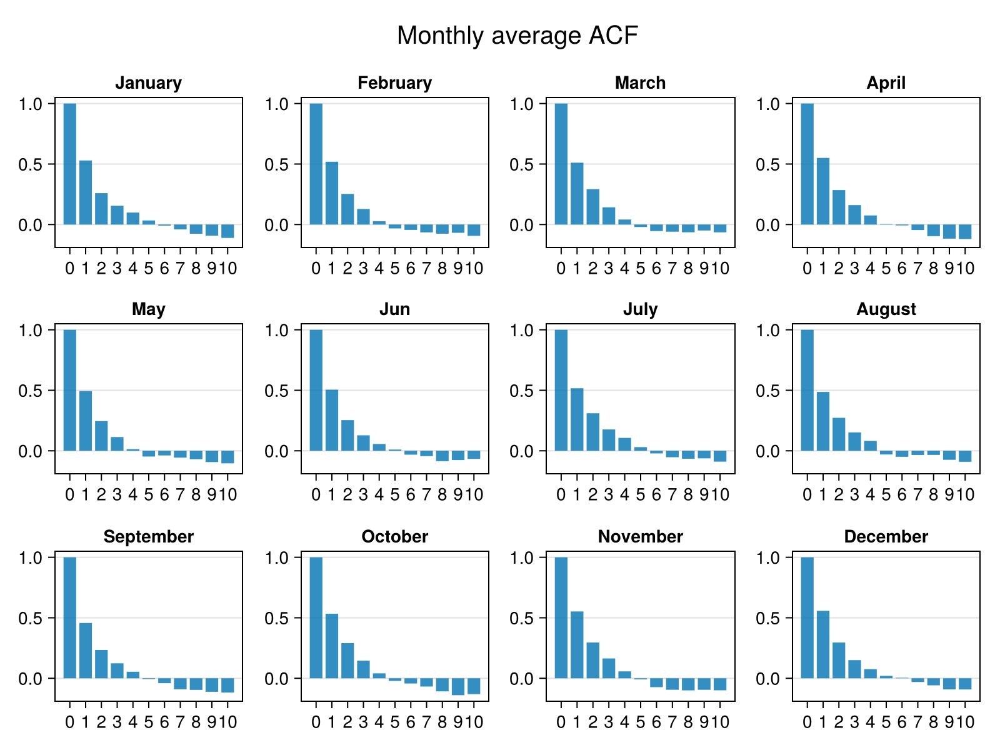

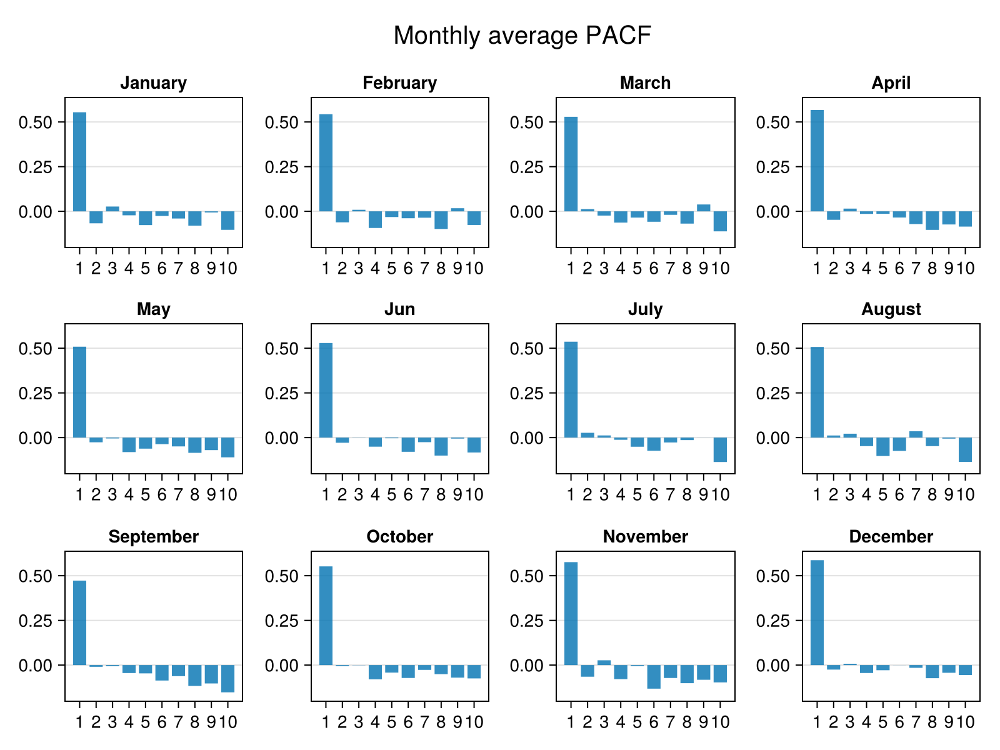

CairoMakie.Screen{IMAGE}


In [22]:
include("../utils/ACF_PACF.jl")
display(MonthlyACF(Monthly_temp))
display(MonthlyPACF(Monthly_temp))

For each month, it still looks like an AR(1) model

# Estimation AR(1)

## Estimation

ERROR: LoadError: too many parameters for type AbstractInterpolation
Stacktrace:
 [1] top-level scope
   @ C:\Users\goninarn\.julia\packages\SparseConnectivityTracer\litqn\ext\SparseConnectivityTracerDataInterpolationsExt.jl:28
 [2] include
   @ .\Base.jl:557 [inlined]
 [3] include_package_for_output(pkg::Base.PkgId, input::String, depot_path::Vector{String}, dl_load_path::Vector{String}, load_path::Vector{String}, concrete_deps::Vector{Pair{Base.PkgId, UInt128}}, source::String)
   @ Base .\loading.jl:2881
 [4] top-level scope
   @ stdin:6
in expression starting at C:\Users\goninarn\.julia\packages\SparseConnectivityTracer\litqn\ext\SparseConnectivityTracerDataInterpolationsExt.jl:3
in expression starting at stdin:6
┌ Error: Error during loading of extension SparseConnectivityTracerDataInterpolationsExt of SparseConnectivityTracer, use `Base.retry_load_extensions()` to retry.
│   exception = 1-element ExceptionStack:
Failed to precompile SparseConnectivityTracerDataInterpolationsExt [

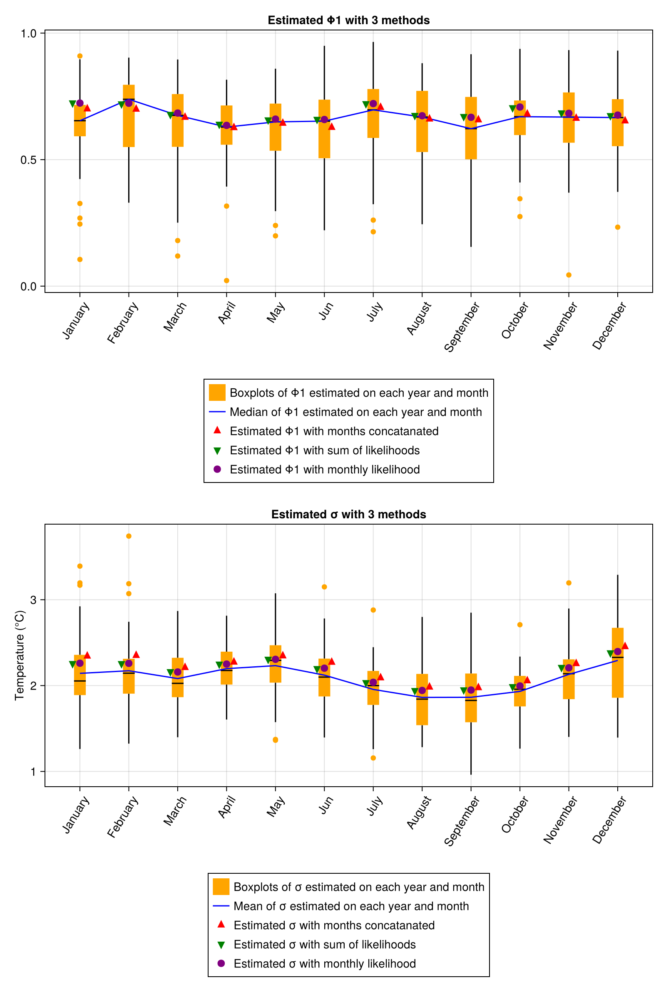

CairoMakie.Screen{IMAGE}


In [23]:
include(raw"..\utils\Estimation.jl")
Params, figure= AllEstimation(x, Date_vec = series.DATE, lineplot=true)
display(figure)

In [24]:
# include(raw"..\utils\Structure.jl")
# model_ = fit_MonthlyAR(series[:, 2], series.DATE)
# display(model_.Φ)
# display(model_.σ)
# model_.nspart == period

## Simulation

### With monthly likelihoods

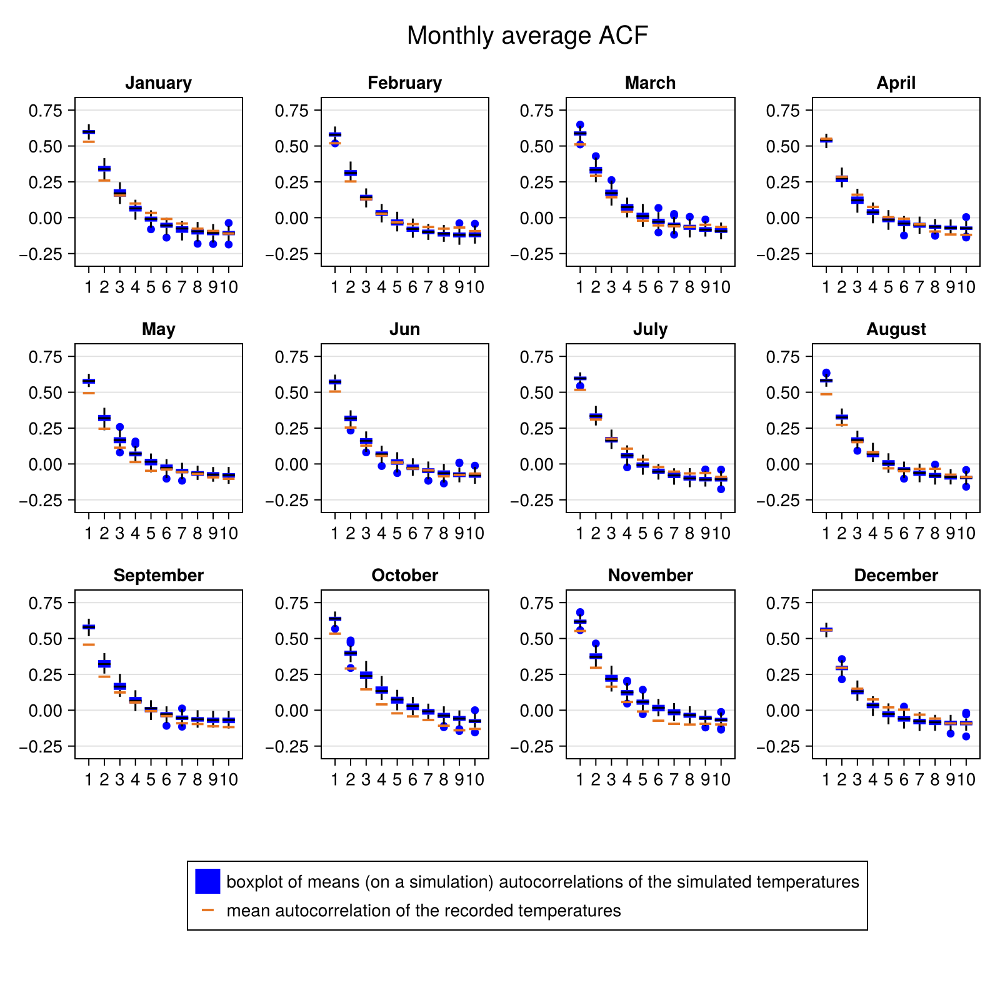

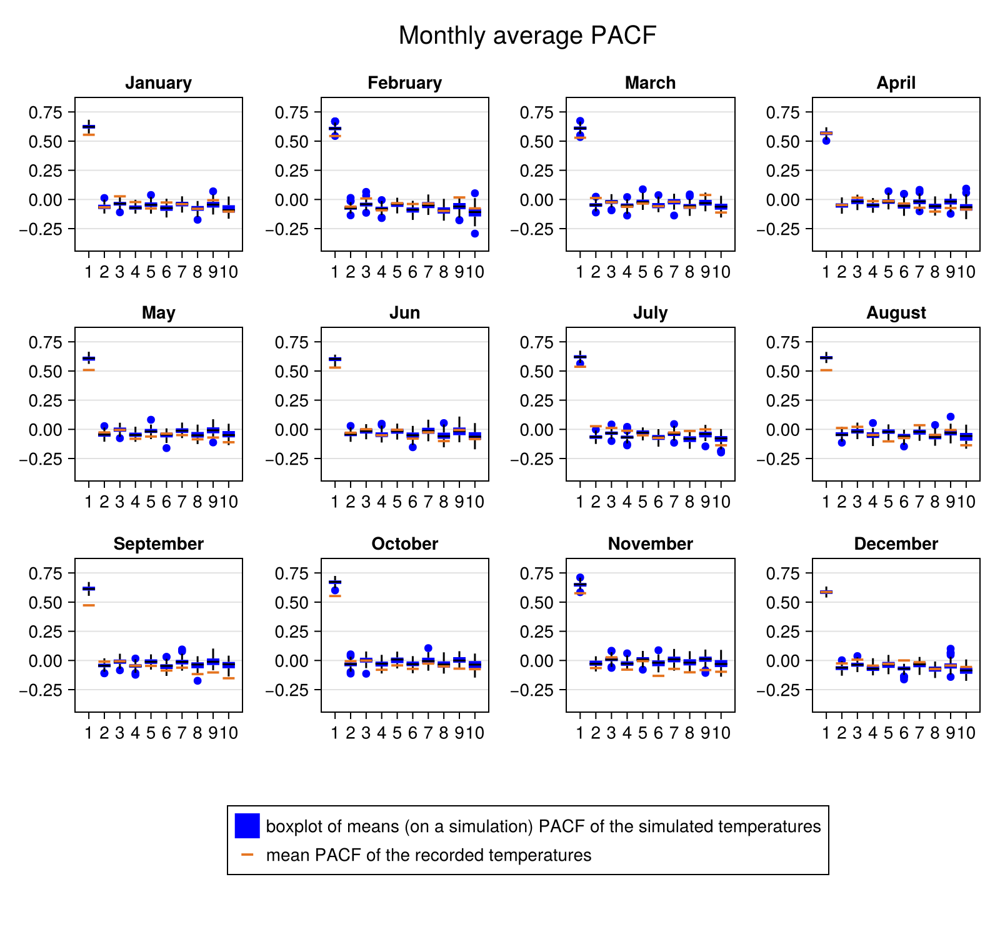

CairoMakie.Screen{IMAGE}


In [25]:
Φ_month_mean,σ_month_mean=TakeParameters(Params,"monthlyLL")
sample_ = SimulateScenarios(Monthly_temp[1][1][1],series.DATE[1]:series.DATE[end],Φ_month_mean,σ_month_mean,period,n=100)
year_sample = GatherYearScenarios(sample_,series.DATE[1]:series.DATE[end])
# display(PlotYearCurves([period,mean.(year_sample)],["Periodicity estimation","Mean simulated temperatures"],"Average daily temperature during a year (centered)"))
# display(PlotYearCurves([period,avg_day,max_day],
# ["Periodicity estimation","Average recorded temperatures","Maximum recorded temperatures","Simulated temperatures range","Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
# "Average daily temperature during a year (centered)",
# [(minimum.(year_sample),maximum.(year_sample)),(quantile.(year_sample,0.25),quantile.(year_sample,0.75))],
# [("#009bff",0.2),("#009bff",0.5)],
# colors=["blue","orange","red"]
# ))
# display(PlotYearCurves([maximum.(year_sample) .- minimum.(year_sample) , quantile.(year_sample,0.75) .- quantile.(year_sample,0.25)],
# ["Simulated temperatures range" ,"Simulated temperatures interquartile range, p ∈ [0.25,0.75]"],
# "Simulated temperatures interquartile range"
# ))
# display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))
display(Plot_Sample_MonthlyACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp))
display(Plot_Sample_MonthlyPACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp))

In [26]:
mean(Error_MonthlyACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp))

0.04508605715392186

In [27]:
MPACF=Error_MonthlyPACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp)
display(mean(MPACF[1,:]))
display(mean(MPACF[2,:]))

0.04148058003311603

0.04376774664428729

# Estimation AR(2)

## Estimation

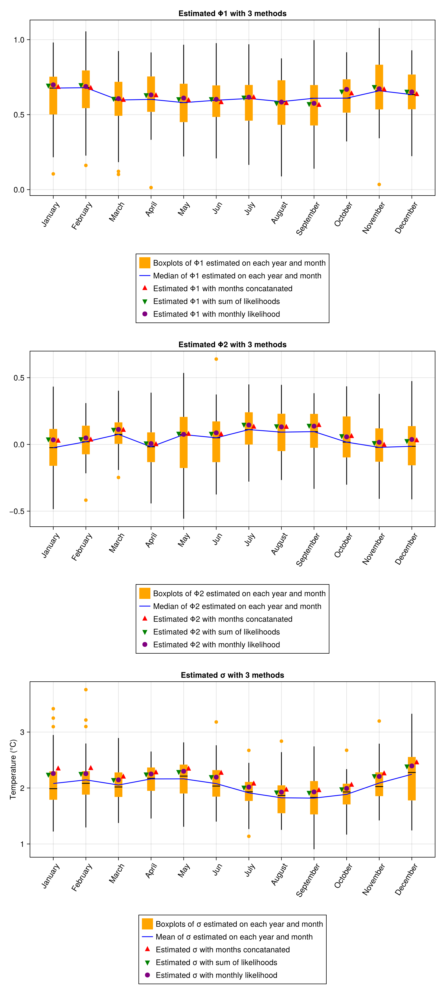

CairoMakie.Screen{IMAGE}


In [28]:
include("../utils/Estimation.jl")
Params, figure= AllEstimation(x, 2, Date_vec=series.DATE, lineplot=true)
display(figure)

In [29]:
params2 = TakeParameters(Params,"monthlyLL")

([[0.6988314048280294, 0.03423564585546461], [0.6875748318821535, 0.048446632262957666], [0.60662371079317, 0.1121361790292808], [0.6313468612474683, 0.006264579642843044], [0.6104804460649229, 0.0754011902302318], [0.6021529788610511, 0.08670949003931863], [0.6160232472892962, 0.14539654558701848], [0.5836370715047398, 0.13158231501326054], [0.5753299402733009, 0.13699179597757105], [0.6684332849995331, 0.05669089397192918], [0.6722416751676596, 0.015995913862815986], [0.651156544667877, 0.03699497953144292]], [2.259295488846583, 2.256557525583171, 2.1453386864696706, 2.2504369531567, 2.299559117171499, 2.1946001565378683, 2.01663846364237, 1.9263628726991895, 1.929961932247913, 1.9927638591984929, 2.2066521277635616, 2.3948661307553274])

In [30]:
include(raw"..\utils\Structure.jl")
model_ = fit_MonthlyAR(series[:, 2], series.DATE, p = 2)
display(model_.Φ)
display(model_.σ)
model_.nspart == period

12-element RowSlices{Matrix{Float64}, Tuple{Base.OneTo{Int64}}, SubArray{Float64, 1, Matrix{Float64}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}}, true}}:
 [0.6988314048280294, 0.03423564585546461]
 [0.6875748318821535, 0.048446632262957666]
 [0.60662371079317, 0.1121361790292808]
 [0.6313468612474683, 0.006264579642843044]
 [0.6104804460649229, 0.0754011902302318]
 [0.6021529788610511, 0.08670949003931863]
 [0.6160232472892962, 0.14539654558701848]
 [0.5836370715047398, 0.13158231501326054]
 [0.5753299402733009, 0.13699179597757105]
 [0.6684332849995331, 0.05669089397192918]
 [0.6722416751676596, 0.015995913862815986]
 [0.651156544667877, 0.03699497953144292]

12-element Vector{Float64}:
 2.259295488846583
 2.256557525583171
 2.1453386864696706
 2.2504369531567
 2.299559117171499
 2.1946001565378683
 2.01663846364237
 1.9263628726991895
 1.929961932247913
 1.9927638591984929
 2.2066521277635616
 2.3948661307553274

true

### Estimation and simulation with monthly likelihoods

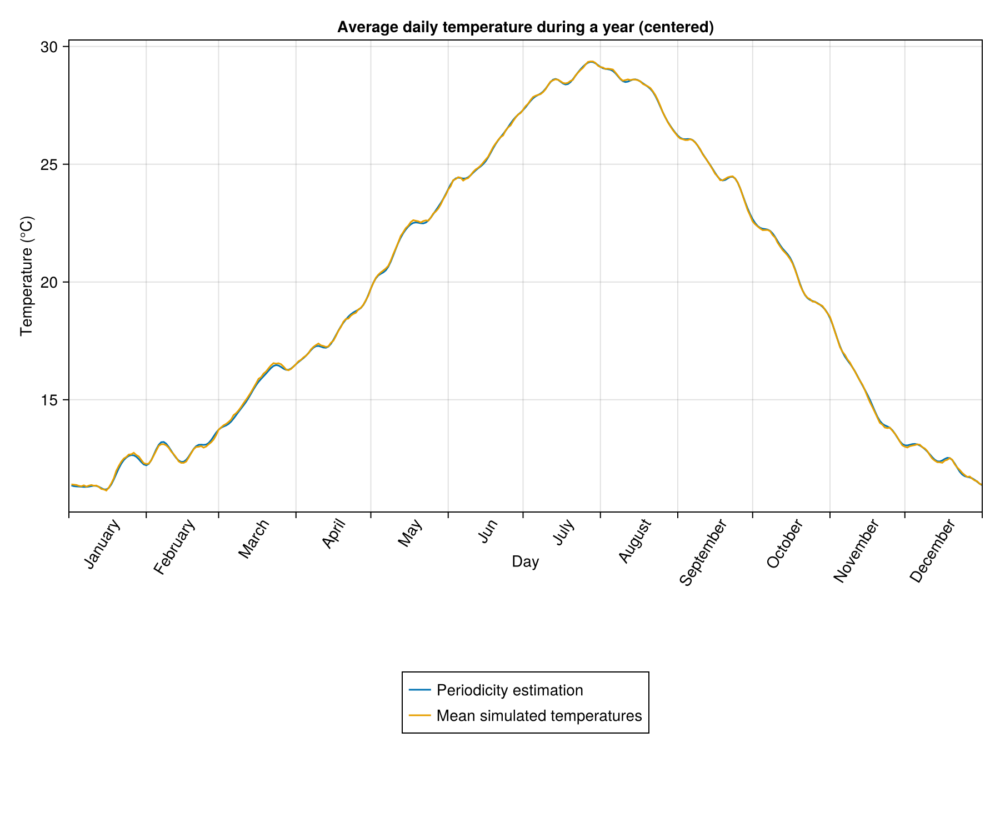

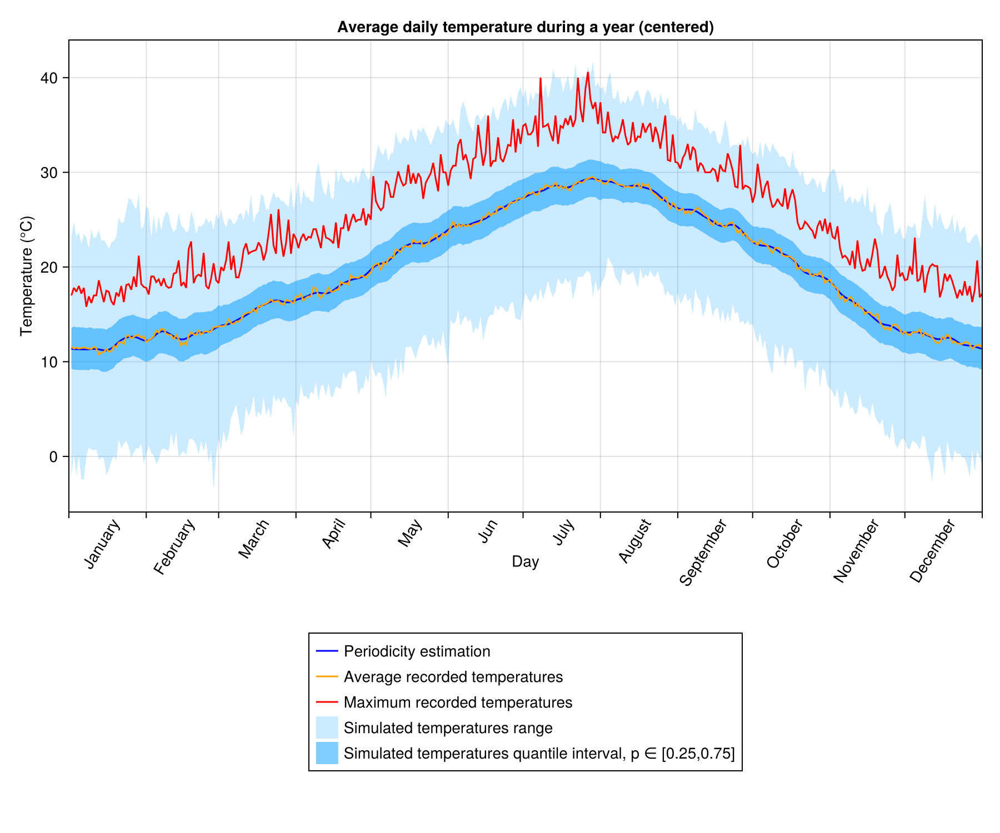

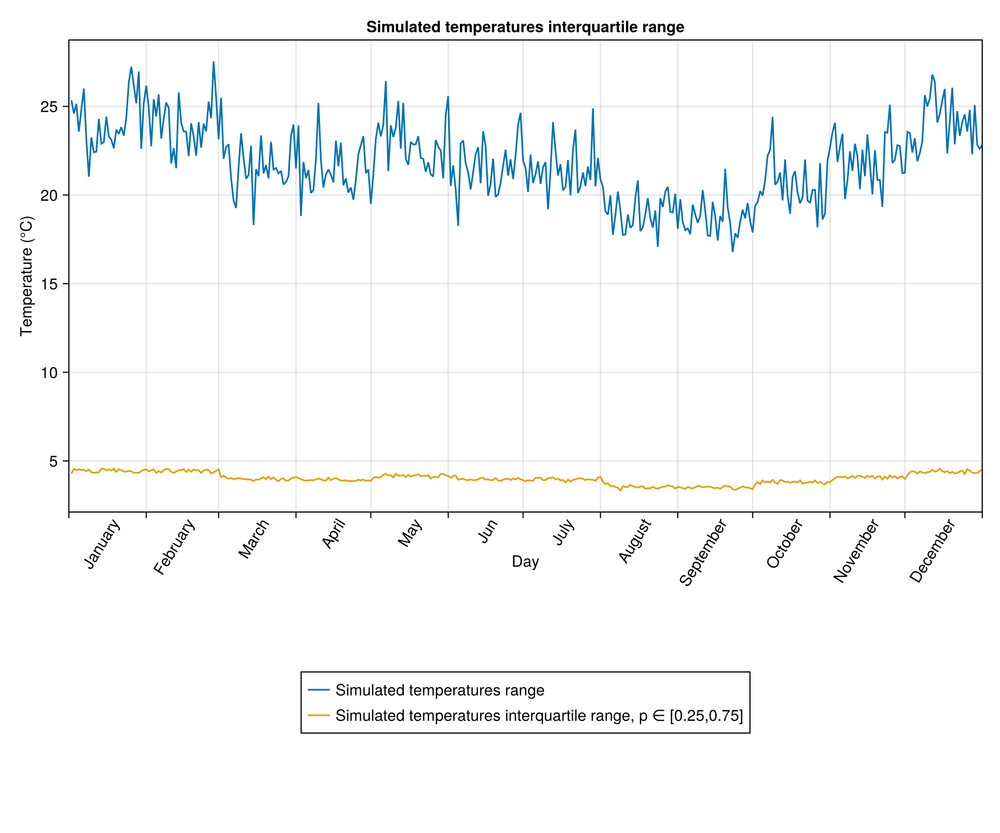

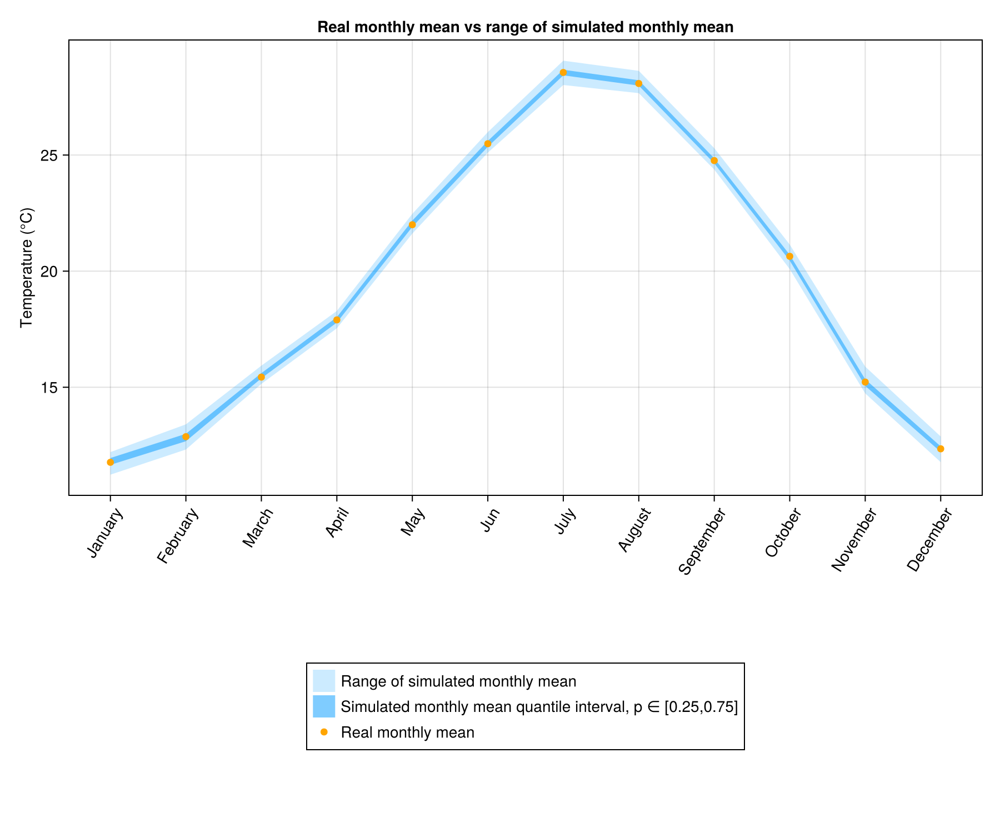

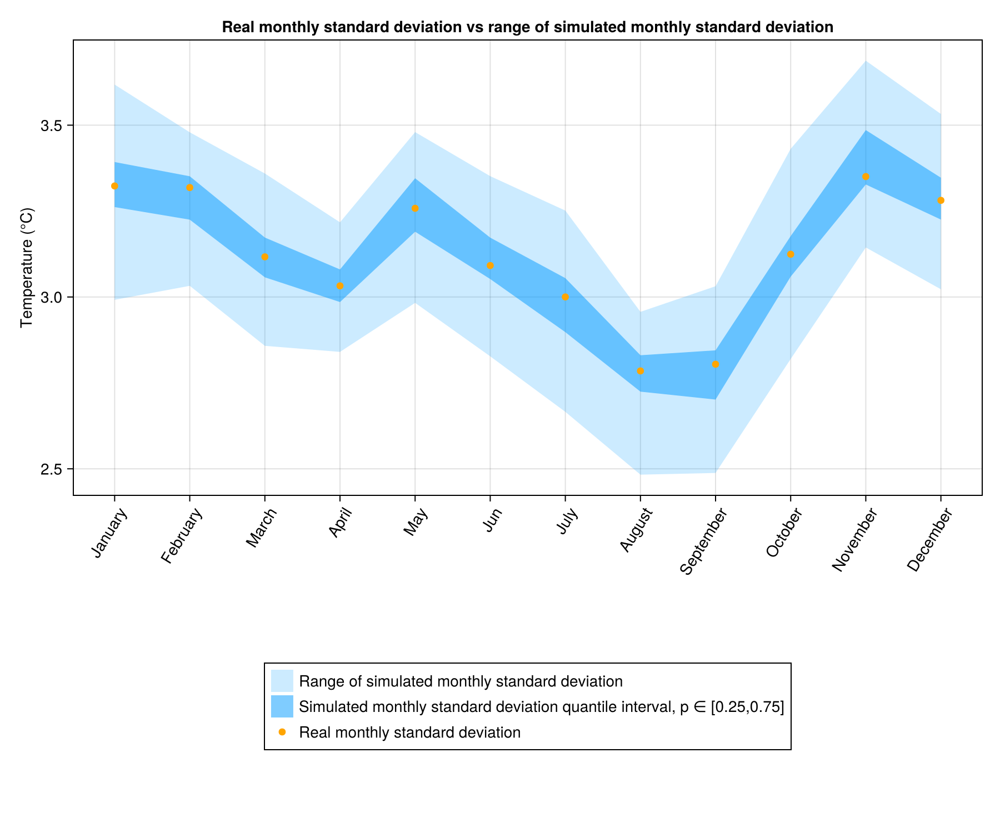

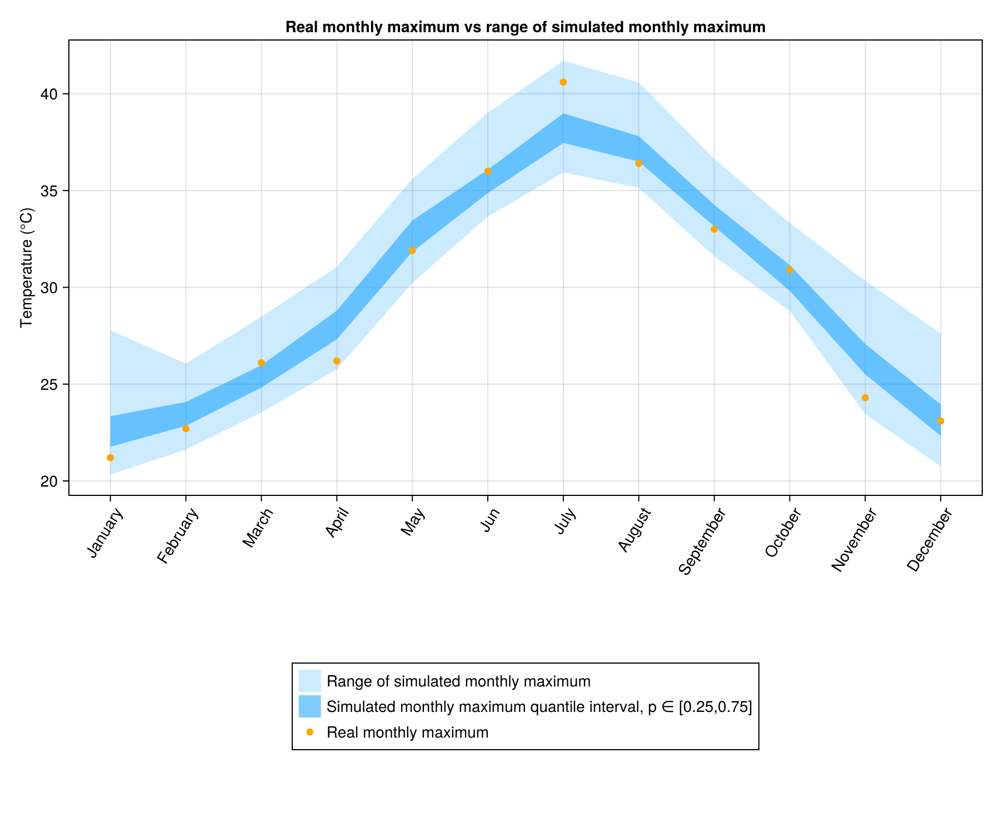

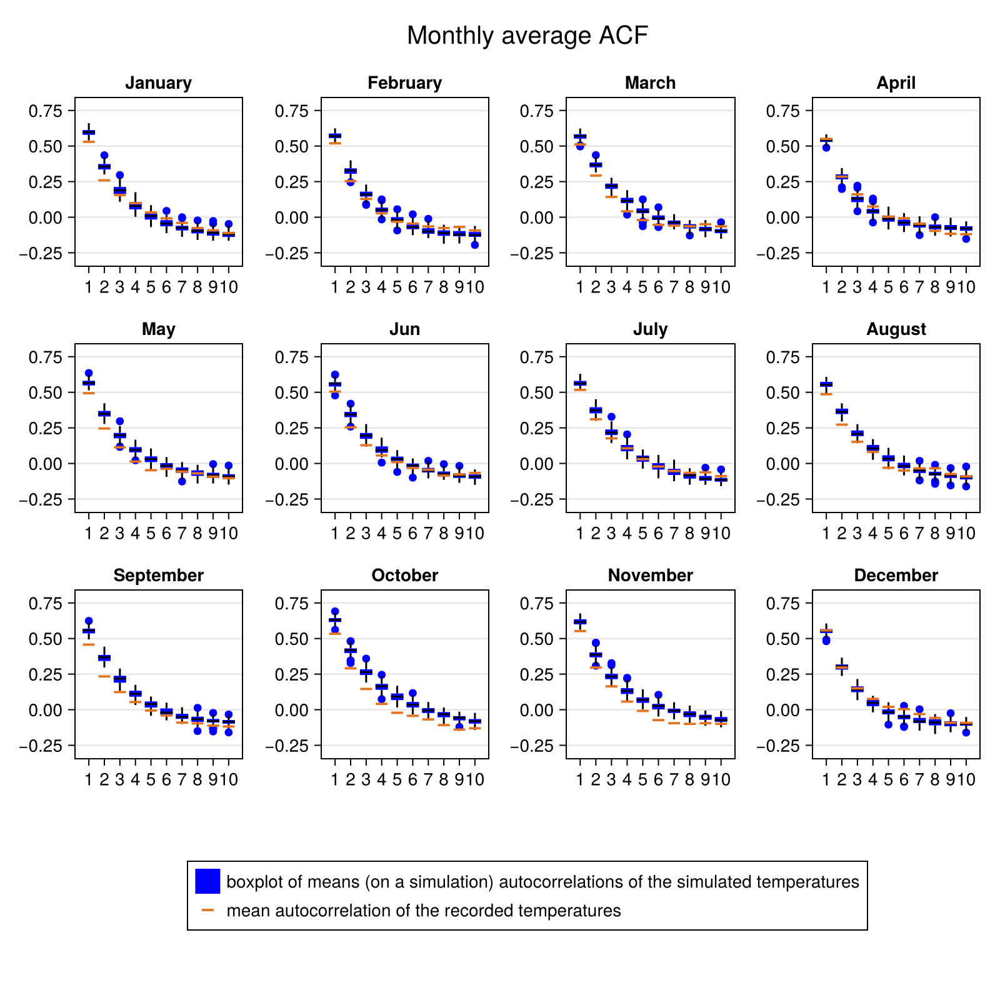

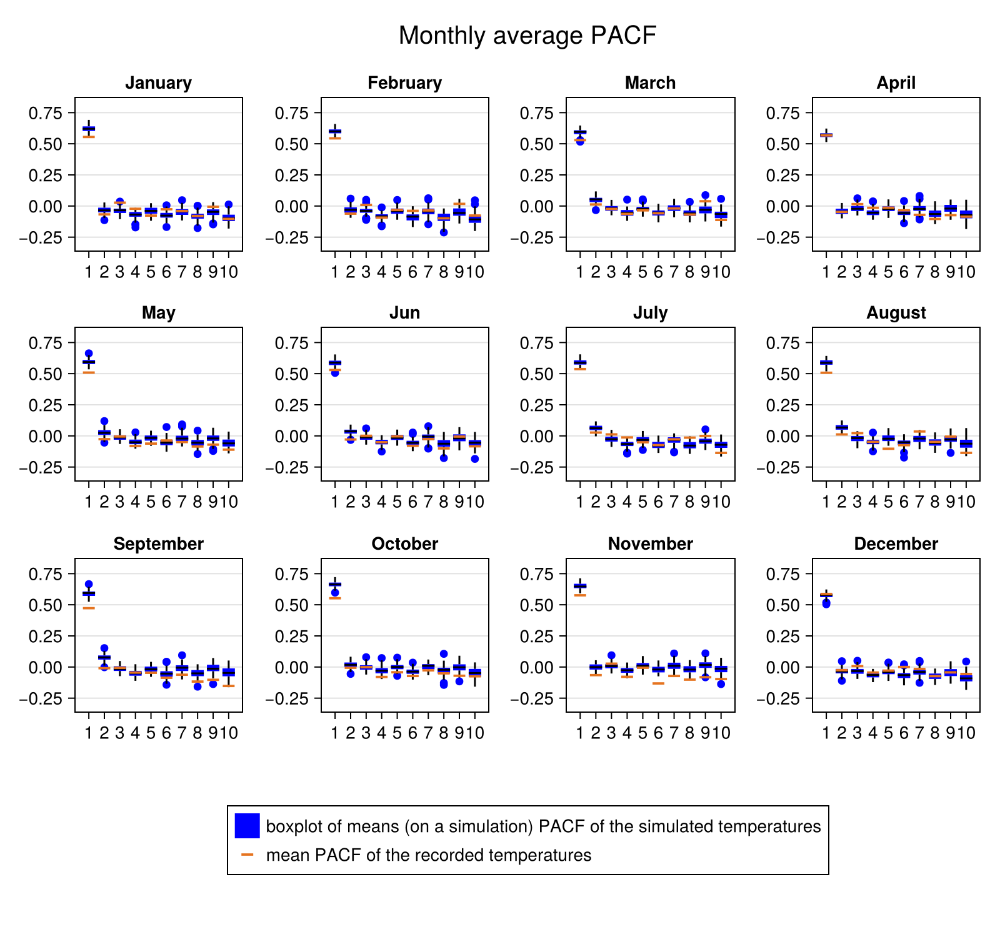

CairoMakie.Screen{IMAGE}


In [31]:
Φ_month_mean,σ_month_mean=TakeParameters(Params,"monthlyLL")
sample_ = SimulateScenarios(Monthly_temp[1][1][1:2],series.DATE[1]:series.DATE[end],Φ_month_mean,σ_month_mean,period,n=100)
year_sample = GatherYearScenarios(sample_,series.DATE[1]:series.DATE[end])
display(PlotYearCurves([period,mean.(year_sample)],["Periodicity estimation","Mean simulated temperatures"],"Average daily temperature during a year (centered)"))
display(PlotYearCurves([period,avg_day,max_day],
["Periodicity estimation","Average recorded temperatures","Maximum recorded temperatures","Simulated temperatures range","Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
"Average daily temperature during a year (centered)",
[(minimum.(year_sample),maximum.(year_sample)),(quantile.(year_sample,0.25),quantile.(year_sample,0.75))],
[("#009bff",0.2),("#009bff",0.5)],
colors=["blue","orange","red"]
))
display(PlotYearCurves([maximum.(year_sample) .- minimum.(year_sample) , quantile.(year_sample,0.75) .- quantile.(year_sample,0.25)],
["Simulated temperatures range" ,"Simulated temperatures interquartile range, p ∈ [0.25,0.75]"],
"Simulated temperatures interquartile range"
))
display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))
display(Plot_Sample_MonthlyACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp))
display(Plot_Sample_MonthlyPACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp))

In [32]:
mean(Error_MonthlyACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp))

0.04942321472897859

In [33]:
MPACF=Error_MonthlyPACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp)
display(mean(MPACF[1,:]))
display(mean(MPACF[2,:]))

0.044066229668525456

0.04158025595364898

L'AR1 semble légérement mieux que l'AR2 car les différences d'ACF avec les données réels sont légérement plus faible. Mais les différences entre les deux possibilités sont assez faibles.

# Test to see if Rand() works to simulate scenarios 

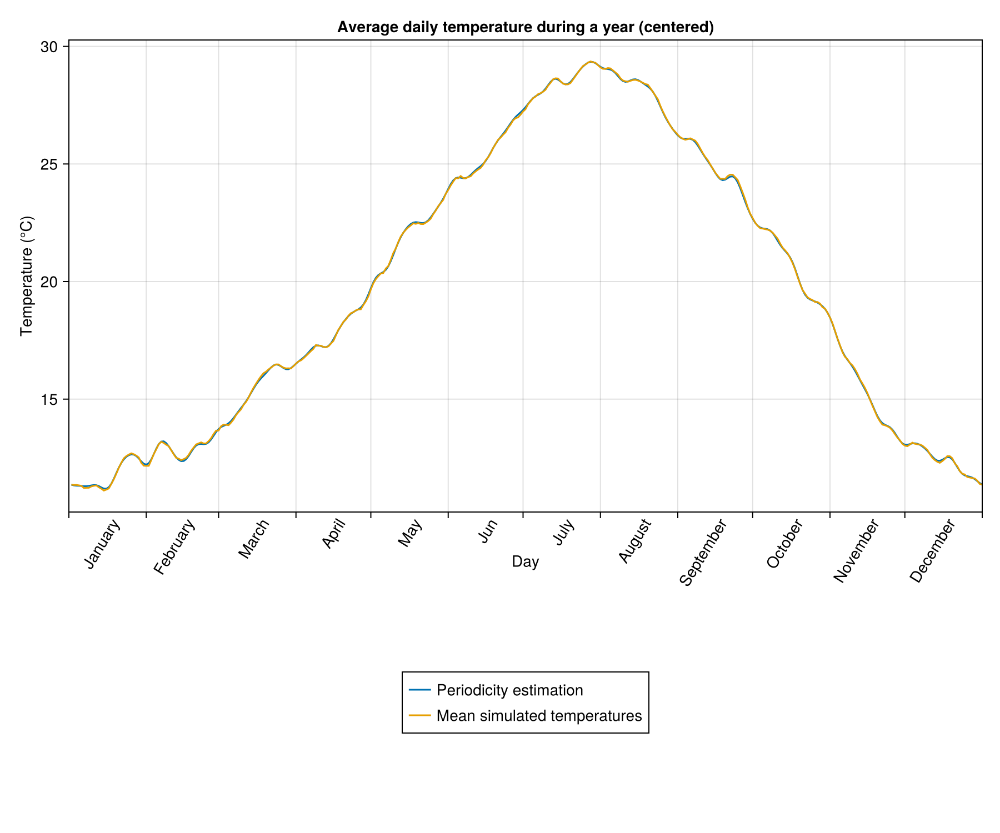

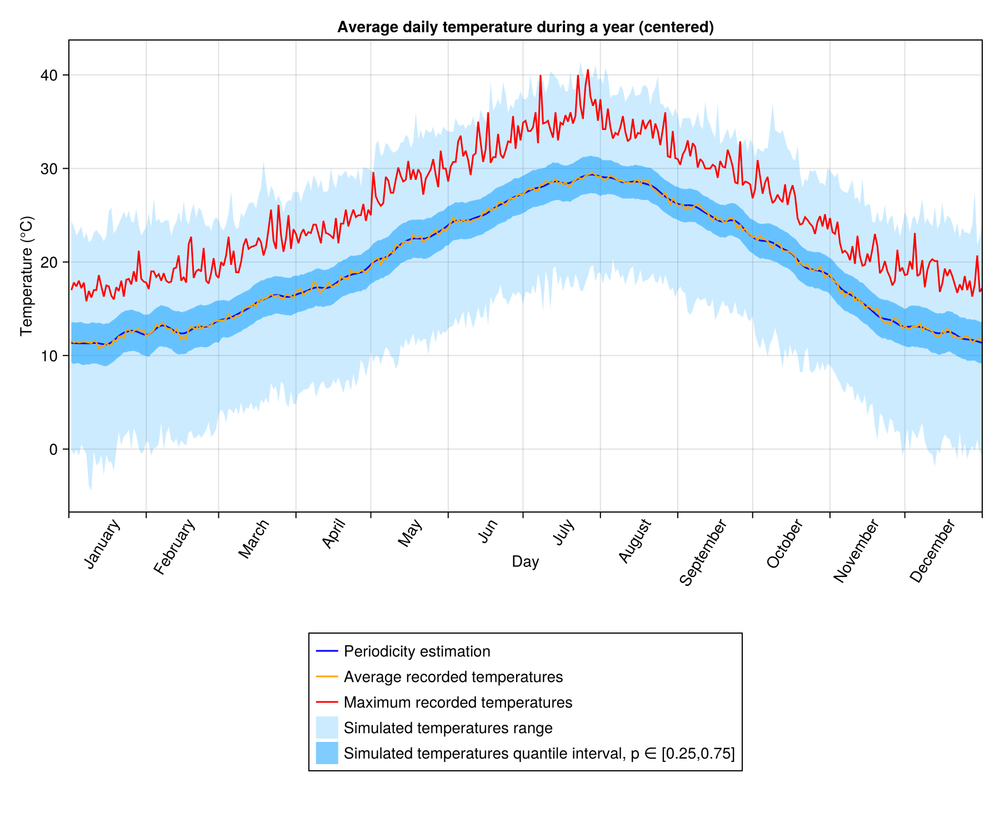

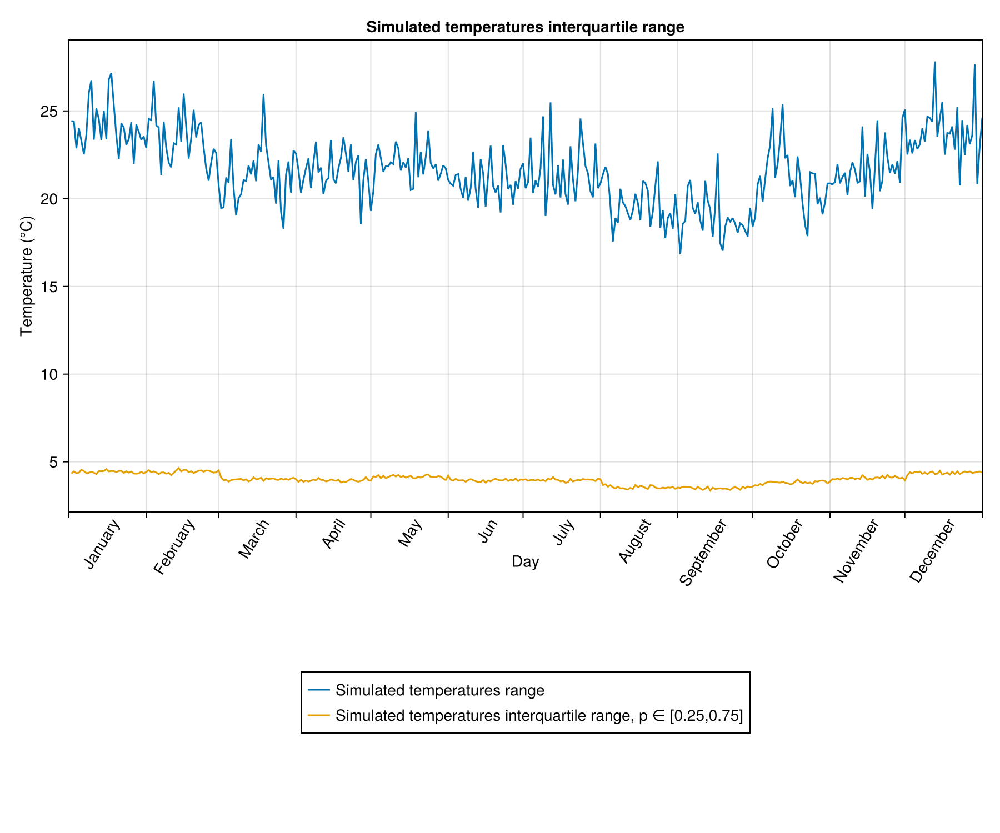

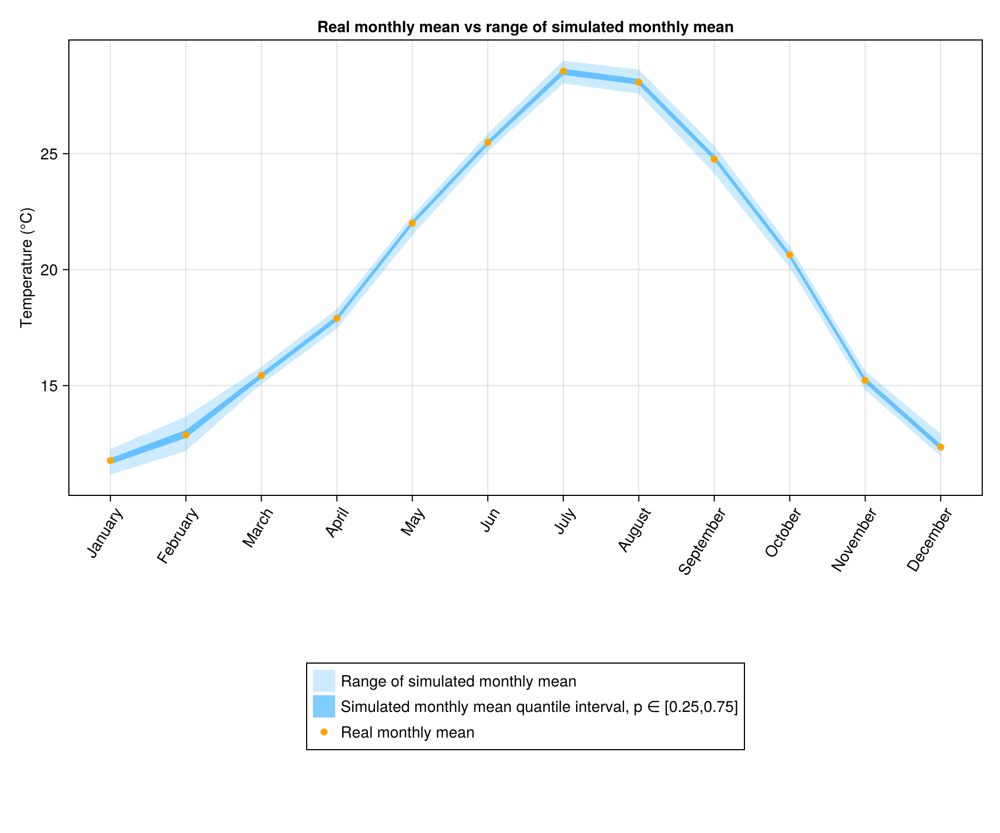

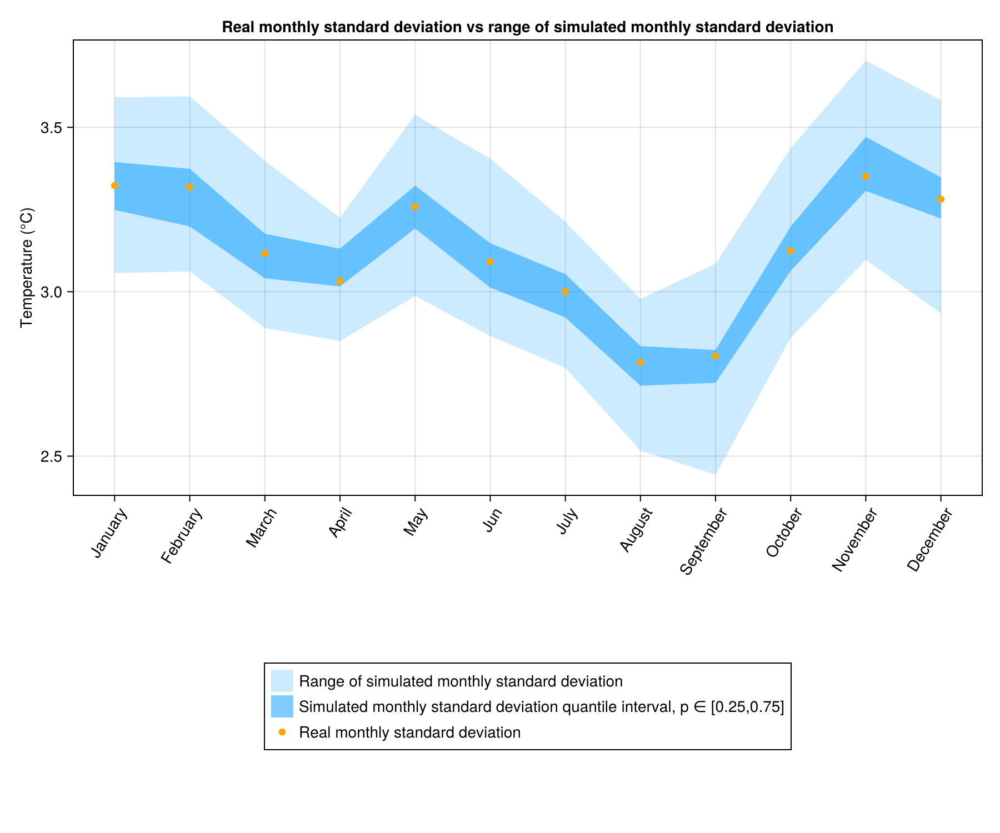

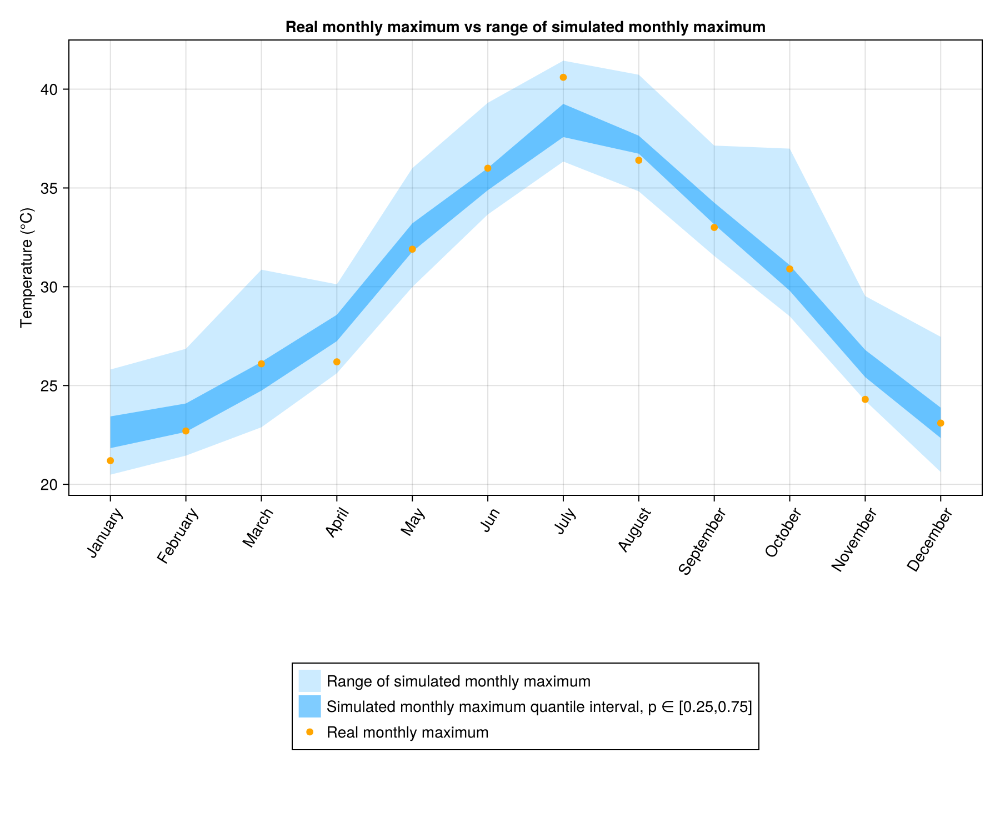

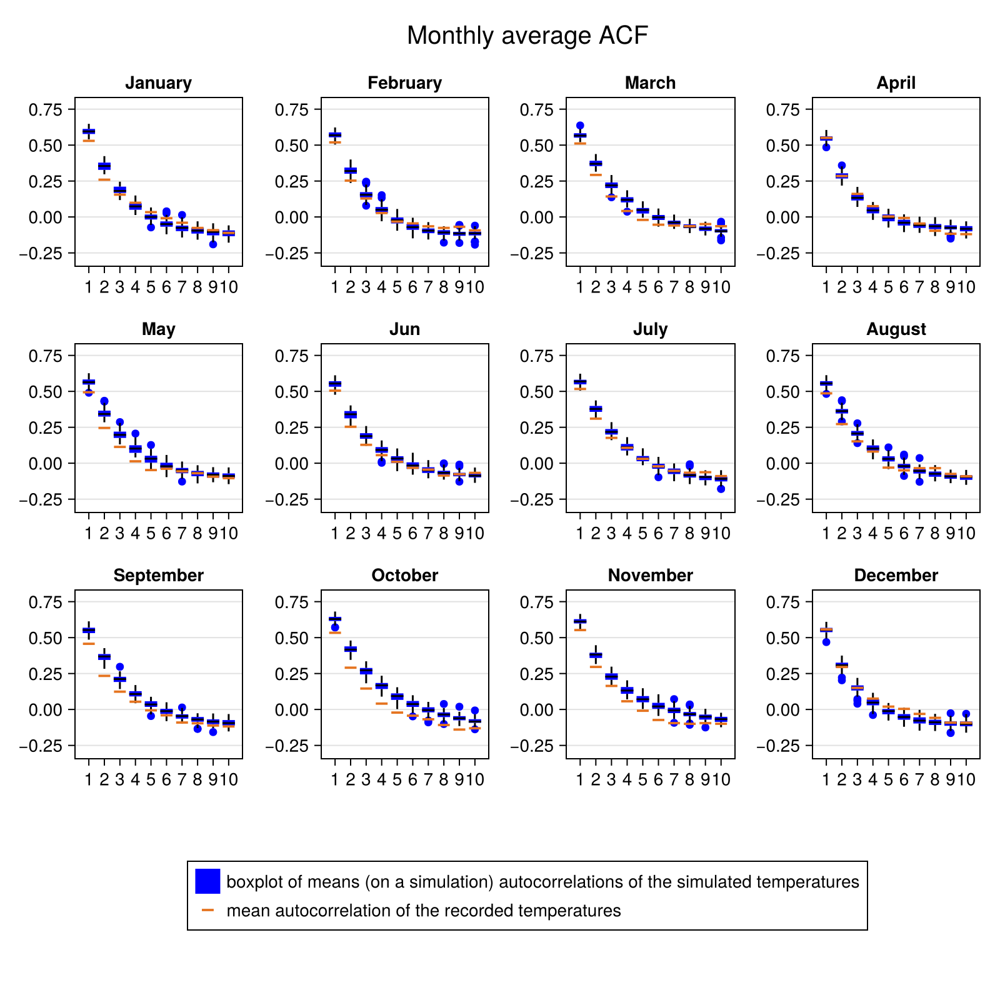

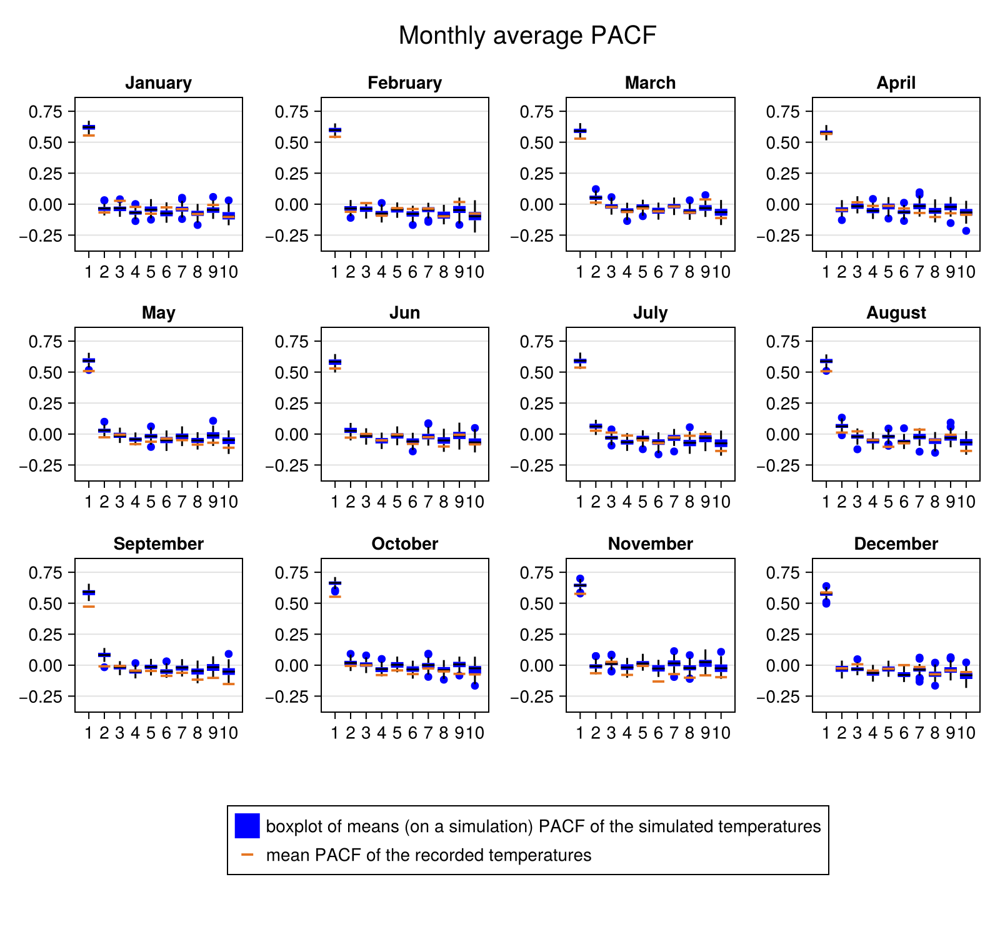

CairoMakie.Screen{IMAGE}


In [34]:
sample_ = rand(model_,series.DATE[1]:series.DATE[end],100)
year_sample = GatherYearScenarios(sample_,series.DATE[1]:series.DATE[end])
display(PlotYearCurves([period,mean.(year_sample)],["Periodicity estimation","Mean simulated temperatures"],"Average daily temperature during a year (centered)"))
display(PlotYearCurves([period,avg_day,max_day],
["Periodicity estimation","Average recorded temperatures","Maximum recorded temperatures","Simulated temperatures range","Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
"Average daily temperature during a year (centered)",
[(minimum.(year_sample),maximum.(year_sample)),(quantile.(year_sample,0.25),quantile.(year_sample,0.75))],
[("#009bff",0.2),("#009bff",0.5)],
colors=["blue","orange","red"]
))
display(PlotYearCurves([maximum.(year_sample) .- minimum.(year_sample) , quantile.(year_sample,0.75) .- quantile.(year_sample,0.25)],
["Simulated temperatures range" ,"Simulated temperatures interquartile range, p ∈ [0.25,0.75]"],
"Simulated temperatures interquartile range"
))
display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))
display(Plot_Sample_MonthlyACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp))
display(Plot_Sample_MonthlyPACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp))